### We use the SMPS data to see if we can draw any insights

In [2]:
import pandas as pd
data = pd.read_excel('/home/coliewo/Downloads/SMPS_hh_24giu_14ott.xlsx')

In [3]:
data.head(5)

,data,year,month,day,hh,c13_1,c13_58,c14_07,c14_59,c15_12,...,c513_97,c532_8,c552_32,c572_55,c593_52,c615_27,c637_8,c661_17,c685_39,c710_5
0,"Jun 24, 2024 11",2024,6,24,11,14308.890,11883.360,9731.859,8662.094,7270.084,...,36.00750,26.67740,23.257700,22.868900,12.890900,14.594200,10.136400,10.853000,10.190900,8.051300
1,"Jun 24, 2024 13",2024,6,24,13,20662.980,20553.160,19914.960,19126.650,18301.370,...,46.50563,25.23555,25.902090,27.080360,18.783640,17.110640,16.938450,15.212910,16.036540,9.321273
2,"Jun 24, 2024 14",2024,6,24,14,9105.685,9442.173,9146.427,9198.382,8995.156,...,23.27560,27.68760,19.205600,17.888700,11.724200,9.887900,9.801499,7.926900,9.851501,6.275000
3,"Jun 24, 2024 15",2024,6,24,15,6857.442,7020.820,6873.857,6599.685,6558.964,...,11.15933,13.13633,6.995083,8.435083,8.712833,7.676667,5.779500,7.949333,5.707667,6.162500
4,"Jun 24, 2024 16",2024,6,24,16,17506.850,17002.660,16125.820,15733.620,14922.340,...,12.88175,14.89458,15.176170,15.057670,11.219830,8.377167,9.543083,10.007750,9.030583,8.310250


In [7]:
# Combine year, month, day, and hour into a single datetime index
#data['datetime'] = pd.to_datetime(data[['year', 'month', 'day', 'hh']])

data['datetime'] = pd.to_datetime(
    data['year'].astype(str) + '-' + 
    data['month'].astype(str) + '-' + 
    data['day'].astype(str) + ' ' + 
    data['hh'].astype(str) + ':00:00'
)
data.set_index('datetime', inplace=True)

# Drop redundant columns
data.drop(columns=['data', 'year', 'month', 'day', 'hh'], inplace=True)

data.head(5)

,c13_1,c13_58,c14_07,c14_59,c15_12,c15_68,c16_25,c16_85,c17_47,c18_11,...,c513_97,c532_8,c552_32,c572_55,c593_52,c615_27,c637_8,c661_17,c685_39,c710_5
datetime,,,,,,,,,,,,,,,,,,,,,
2024-06-24 11:00:00,14308.890,11883.360,9731.859,8662.094,7270.084,6747.208,6133.196,5965.710,5683.491,5553.574,...,36.00750,26.67740,23.257700,22.868900,12.890900,14.594200,10.136400,10.853000,10.190900,8.051300
2024-06-24 13:00:00,20662.980,20553.160,19914.960,19126.650,18301.370,17597.470,16580.030,15611.780,14679.840,13949.720,...,46.50563,25.23555,25.902090,27.080360,18.783640,17.110640,16.938450,15.212910,16.036540,9.321273
2024-06-24 14:00:00,9105.685,9442.173,9146.427,9198.382,8995.156,8769.919,8636.431,8374.032,8169.299,7718.021,...,23.27560,27.68760,19.205600,17.888700,11.724200,9.887900,9.801499,7.926900,9.851501,6.275000
2024-06-24 15:00:00,6857.442,7020.820,6873.857,6599.685,6558.964,6429.842,6063.840,5989.944,5690.349,5438.591,...,11.15933,13.13633,6.995083,8.435083,8.712833,7.676667,5.779500,7.949333,5.707667,6.162500
2024-06-24 16:00:00,17506.850,17002.660,16125.820,15733.620,14922.340,14292.730,13310.670,12388.290,11698.710,10938.730,...,12.88175,14.89458,15.176170,15.057670,11.219830,8.377167,9.543083,10.007750,9.030583,8.310250


In [8]:
# Ensure only particle size columns are converted to float
#diameter_columns = [col for col in data.columns if col.startswith('c')]  # Select only concentration columns
new_column_names = {col: float(col.replace('c', '').replace('_', '.')) for col in data.columns}

# Rename columns
data.rename(columns=new_column_names, inplace=True)

data.head(5)

,13.10,13.58,14.07,14.59,15.12,15.68,16.25,16.85,17.47,18.11,...,513.97,532.80,552.32,572.55,593.52,615.27,637.80,661.17,685.39,710.50
datetime,,,,,,,,,,,,,,,,,,,,,
2024-06-24 11:00:00,14308.890,11883.360,9731.859,8662.094,7270.084,6747.208,6133.196,5965.710,5683.491,5553.574,...,36.00750,26.67740,23.257700,22.868900,12.890900,14.594200,10.136400,10.853000,10.190900,8.051300
2024-06-24 13:00:00,20662.980,20553.160,19914.960,19126.650,18301.370,17597.470,16580.030,15611.780,14679.840,13949.720,...,46.50563,25.23555,25.902090,27.080360,18.783640,17.110640,16.938450,15.212910,16.036540,9.321273
2024-06-24 14:00:00,9105.685,9442.173,9146.427,9198.382,8995.156,8769.919,8636.431,8374.032,8169.299,7718.021,...,23.27560,27.68760,19.205600,17.888700,11.724200,9.887900,9.801499,7.926900,9.851501,6.275000
2024-06-24 15:00:00,6857.442,7020.820,6873.857,6599.685,6558.964,6429.842,6063.840,5989.944,5690.349,5438.591,...,11.15933,13.13633,6.995083,8.435083,8.712833,7.676667,5.779500,7.949333,5.707667,6.162500
2024-06-24 16:00:00,17506.850,17002.660,16125.820,15733.620,14922.340,14292.730,13310.670,12388.290,11698.710,10938.730,...,12.88175,14.89458,15.176170,15.057670,11.219830,8.377167,9.543083,10.007750,9.030583,8.310250


In [ ]:
import plotly.express as px
fig = px.imshow(data.T, color_continuous_scale='RdBu_r', origin='lower')
fig.show()

In [14]:
import numpy as np

In [17]:

fig = px.imshow(
    data.T,
    color_continuous_scale='RdBu_r',
    origin='lower'
)

# Set y-axis to log scale
fig.update_layout(
    yaxis_type="log",
    coloraxis_colorbar=dict(
        tickmode='array',
        tickvals=[10, 100, 1000],
        ticktext=["10", "100", "1000"]
    )
)

fig.show()


In [18]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker


/tmp/ipykernel_8287/3554119083.py:2: UserWarning:

Log scale: values of z <= 0 have been masked



Text(0.5, 1.0, 'Particle Number Size Distribution')

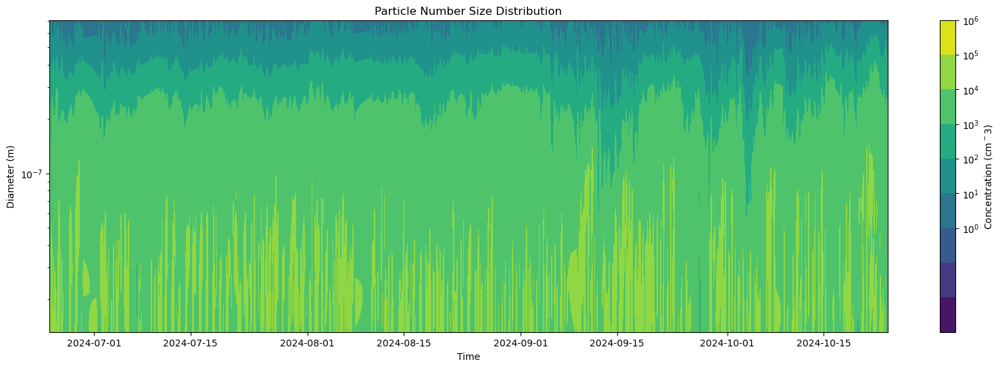

In [45]:
plt.figure(figsize=(20,6))
plt.contourf(data.index, data.columns*1e-9, data.T, locator=ticker.LogLocator())
plt.colorbar(ticks=[1,1e1,1e2,1e3,1e4,1e5,1e6], label="Concentration (cm$^-3$)")
plt.yscale('log')
plt.ylabel("Diameter (m)")
plt.xlabel("Time")
plt.title("Particle Number Size Distribution")

In [62]:
# Resample the dataset to daily timescale by grouping data by day

daily_data = data.resample('D')

In [63]:
data.loc[daily_data.index.hour == hour].mean()

AttributeError: 'DatetimeIndexResampler' object has no attribute 'index'

In [47]:
from scipy.stats import lognorm

In [55]:
# initialize lists to store results
formation_times = []
formation_diameters = []
stop_times = []
stop_diameters = []

# Loop through each day and detect growth patterns
for day, data in daily_data:
    if data.isna().all().all():  # Skip empty days
        continue

    growth_start = None
    growth_stop = None
    previous_mode = None
    peak_diameter = None

    for hour in range(24):
        if hour not in data.index.hour:
            continue  # Skip missing hours

        # Get particle concentration distribution for the current hour
        hourly_concentration = data.loc[data.index.hour == hour].mean()

        # Fit a lognormal distribution to the particle size distribution
        shape, loc, scale = lognorm.fit(hourly_concentration, floc=0)

        # Calculate mode of lognormal distribution (most likely particle size)
        mode_diameter = np.exp(np.log(scale) - shape**2)

        # Enforce lower bound of 13.1 nm

        mode_diameter = max(mode_diameter, min(data.columns))    ## complicates the data, but without it before the formation dim was lower than the min diam????


        # Detect growth start: The first hour where a significant increase is observed
        if previous_mode is not None and growth_start is None and mode_diameter > previous_mode * 1.2:
            growth_start = hour
            formation_times.append(day + pd.Timedelta(hours=hour))
            formation_diameters.append(mode_diameter)
            peak_diameter = mode_diameter  # Track peak for correct stop detection

        # Continue tracking growth phase and update peak diameter
        if growth_start is not None and mode_diameter > peak_diameter:
            peak_diameter = mode_diameter

        # Detect growth stop: When the diameter starts decreasing after peaking
        if growth_start is not None and mode_diameter < peak_diameter * 0.9:
            growth_stop = hour
            stop_times.append(day + pd.Timedelta(hours=hour))
            stop_diameters.append(peak_diameter)
            break  # Stop searching after detecting the stop

        # Update previous mode
        previous_mode = mode_diameter

# Ensure all lists are of the same length
max_len = max(len(formation_times), len(stop_times))

# Pad lists with NaN where necessary
while len(formation_times) < max_len:
    formation_times.append(np.nan)
    formation_diameters.append(np.nan)

while len(stop_times) < max_len:
    stop_times.append(np.nan)
    stop_diameters.append(np.nan)

# Create a corrected DataFrame to store results
growth_events_fixed = pd.DataFrame({
    "Formation Time": formation_times,
    "Formation Diameter (nm)": formation_diameters,
    "Stop Time": stop_times,
    "Stop Diameter (nm)": stop_diameters
})

In [56]:
growth_events_fixed

,Formation Time,Formation Diameter (nm),Stop Time,Stop Diameter (nm)
0,2024-06-25 02:00:00,18.360297,2024-06-25 04:00:00,18.360297
1,2024-06-26 07:00:00,19.835445,2024-06-26 09:00:00,30.378109
2,2024-06-28 05:00:00,23.092629,2024-06-28 06:00:00,23.092629
3,2024-06-29 05:00:00,45.754262,2024-06-29 06:00:00,45.754262
4,2024-07-01 13:00:00,17.730542,2024-07-01 14:00:00,17.730542
...,...,...,...,...
93,2024-10-19 03:00:00,38.675882,2024-10-22 07:00:00,286.224005
94,2024-10-20 07:00:00,30.337062,2024-10-23 19:00:00,57.201390
95,2024-10-21 06:00:00,79.190805,NaT,NaN
96,2024-10-22 06:00:00,286.224005,NaT,NaN


In [57]:
# Remove rows where Formation Diameter equals Stop Diameter
growth_events_filtered = growth_events_fixed[growth_events_fixed["Formation Diameter (nm)"] != growth_events_fixed["Stop Diameter (nm)"]]

growth_events_filtered


,Formation Time,Formation Diameter (nm),Stop Time,Stop Diameter (nm)
1,2024-06-26 07:00:00,19.835445,2024-06-26 09:00:00,30.378109
5,2024-07-03 21:00:00,20.073786,2024-07-05 07:00:00,17.134953
6,2024-07-05 05:00:00,15.745877,2024-07-07 12:00:00,59.667784
7,2024-07-07 04:00:00,28.600605,2024-07-09 07:00:00,42.949735
8,2024-07-09 05:00:00,37.044641,2024-07-10 11:00:00,44.537992
...,...,...,...,...
93,2024-10-19 03:00:00,38.675882,2024-10-22 07:00:00,286.224005
94,2024-10-20 07:00:00,30.337062,2024-10-23 19:00:00,57.201390
95,2024-10-21 06:00:00,79.190805,NaT,NaN
96,2024-10-22 06:00:00,286.224005,NaT,NaN


In [58]:
# Calculate growth duration in hours
growth_events_filtered["Growth Duration (hrs)"] = (growth_events_filtered["Stop Time"] - growth_events_filtered["Formation Time"]).dt.total_seconds() / 3600

# Remove rows where growth duration is less than 3 hours
growth_events_final = growth_events_filtered[growth_events_filtered["Growth Duration (hrs)"] >= 3]

# Drop the temporary column used for filtering
growth_events_final.drop(columns=["Growth Duration (hrs)"], inplace=True)

growth_events_final

/tmp/ipykernel_8287/2207971342.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_8287/2207971342.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Formation Time,Formation Diameter (nm),Stop Time,Stop Diameter (nm)
5,2024-07-03 21:00:00,20.073786,2024-07-05 07:00:00,17.134953
6,2024-07-05 05:00:00,15.745877,2024-07-07 12:00:00,59.667784
7,2024-07-07 04:00:00,28.600605,2024-07-09 07:00:00,42.949735
8,2024-07-09 05:00:00,37.044641,2024-07-10 11:00:00,44.537992
9,2024-07-10 10:00:00,44.537992,2024-07-11 17:00:00,20.866091
...,...,...,...,...
90,2024-10-16 05:00:00,150.929187,2024-10-19 06:00:00,76.727437
91,2024-10-17 02:00:00,60.365785,2024-10-20 10:00:00,30.337062
92,2024-10-18 04:00:00,30.285610,2024-10-21 08:00:00,122.240887
93,2024-10-19 03:00:00,38.675882,2024-10-22 07:00:00,286.224005


In [60]:
# Set the minimum valid particle diameter based on dataset (13.1 nm)
min_diameter = min(data.columns)  # Should be 13.1 nm

# Resample the dataset to daily timescale by grouping data by day
daily_data = data.resample('D')

# Reinitialize lists to store corrected results
formation_times = []
formation_diameters = []
stop_times = []
stop_diameters = []

# Loop through each day and detect correct growth patterns
for day, data in daily_data:
    if data.isna().all().all():  # Skip empty days
        continue

    growth_start = None
    growth_stop = None
    previous_mode = None
    peak_diameter = None

    for hour in range(24):
        if hour not in data.index.hour:
            continue  # Skip missing hours

        # Get particle concentration distribution for the current hour
        hourly_concentration = data.loc[data.index.hour == hour].mean()

        # Fit a lognormal distribution to the particle size distribution
        shape, loc, scale = lognorm.fit(hourly_concentration, floc=0)

        # Calculate mode of lognormal distribution (most likely particle size)
        mode_diameter = np.exp(np.log(scale) - shape**2)

        # Enforce lower bound of 13.1 nm
        #mode_diameter = max(mode_diameter, min_diameter)

        # Detect growth start: The first hour where a significant increase is observed
        if previous_mode is not None and growth_start is None and mode_diameter > previous_mode * 1.2:
            growth_start = hour
            formation_times.append(day + pd.Timedelta(hours=hour))
            formation_diameters.append(mode_diameter)
            peak_diameter = mode_diameter  # Track peak for correct stop detection

        # Continue tracking growth phase and update peak diameter
        if growth_start is not None and mode_diameter > peak_diameter:
            peak_diameter = mode_diameter

        # Detect growth stop: When the diameter starts decreasing after peaking
        if growth_start is not None and mode_diameter < peak_diameter * 0.9:
            growth_stop = hour
            stop_times.append(day + pd.Timedelta(hours=hour))
            stop_diameters.append(peak_diameter)
            break  # Stop searching after detecting the stop

        # Update previous mode
        previous_mode = mode_diameter

# Create a corrected DataFrame to store results
growth_events_corrected = pd.DataFrame({
    "Formation Time": formation_times,
    "Formation Diameter (nm)": formation_diameters,
    "Stop Time": stop_times,
    "Stop Diameter (nm)": stop_diameters
})

growth_events_corrected


,Formation Time,Formation Diameter (nm),Stop Time,Stop Diameter (nm)


<AxesSubplot: xlabel='datetime'>

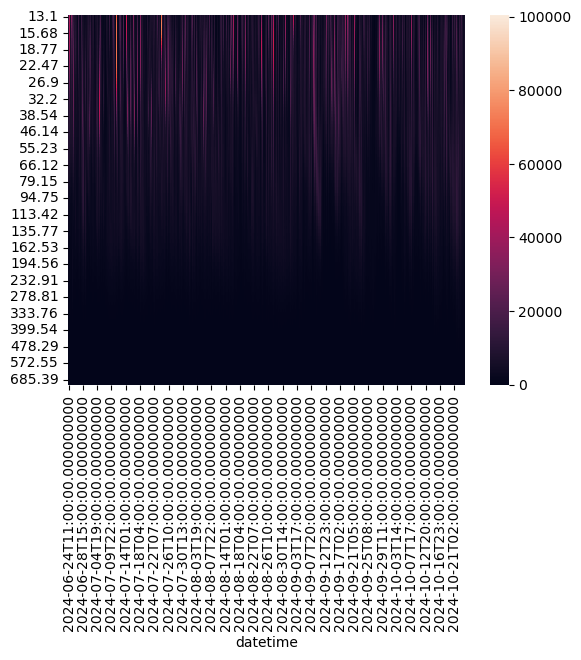

In [12]:
import seaborn as sns

sns.heatmap(data.T)